# Поиск по изображениям

Целью проекта является разработка модели компьютерного зрения для фотохостинга для профессиональных фотографов «Со Смыслом».

Пользователи фотохостинга размещают фотографии, сопровождая их описанием. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала.

Необходимо разработать демонстрационную версию поиска изображений по запросу в следующем порядке: пользователь сервиса вводит описание нужной сцены, а сервис выводит несколько фотографий с такой же или похожей сценой и оценками от  0 до 1, показывающими, насколько текст и картинка подходят друг другу.

Для разработки модели предоставлены наборы данных с фотографиями, описаниями, оценками экспертов и краудсорсеров о соответствии изображения описанию.


Импортируем необходимые библиотеки и их модули

In [1]:
import pandas as pd
import numpy as np
import os
import re
import nltk
import seaborn as sns
import matplotlib.pyplot as plt

from PIL import Image
from pathlib import Path

from tensorflow import keras
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Dropout
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from keras.wrappers.scikit_learn import KerasRegressor
import tensorflow as tf

from pymystem3 import Mystem

from numpy.random import RandomState

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV, GroupShuffleSplit, cross_val_score
from sklearn.linear_model import  LinearRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, log_loss, f1_score, mean_squared_error
from sklearn. linear_model import RidgeCV
from sklearn. model_selection import RepeatedKFold
from sklearn.svm import LinearSVR

from nltk.corpus import stopwords as nltk_stopwords
from nltk.corpus import wordnet
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
nltk.download('averaged_perceptron_tagger')

from tqdm import notebook
from tqdm.notebook import tqdm
tqdm.pandas()



[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


 ## Исследовательский анализ данных

Читаем датасеты, сохраняем их названия в переменных.

In [2]:
PATH = "C:\\Users\\User\\Downloads\\dsplus_integrated_project_4\\to_upload\\"

In [3]:
train_dataset = pd.read_csv(os.path.join(PATH, 'train_dataset.csv'))
train_dataset.name = 'train_dataset'

In [4]:
CrowdAnnotations = pd.read_csv(os.path.join(
    PATH,'CrowdAnnotations.tsv'), sep='\t', header=None, names=["image", "query_id", "part_agree", "sum_agree", "sum_not_agree"])
CrowdAnnotations.name = 'CrowdAnnotations'

In [5]:
ExpertAnnotations = pd.read_csv(os.path.join(PATH, "ExpertAnnotations.tsv"),
                               sep='\t', header=None, names=["image", "query_id", "exp1", "exp2", "exp3"])
ExpertAnnotations.name = 'ExpertAnnotations'

In [6]:
test_images = pd.read_csv(os.path.join(PATH, "test_images.csv"))
test_images.name = 'test_images'

In [7]:
test_queries=pd.read_csv(os.path.join(PATH,"test_queries.csv"), sep='|', index_col=0)
test_queries.name = 'test_queries'

In [8]:
path_train_images = "train_images"

Для минимизации дублирования кодов пишем функцию для изучения данных в полученных наборах: выводим первые строки, информация об объеме данных, пропусках, полных дубликатах.

In [9]:
def study(df):
    display(df.head())
    df.info()
    print('')
    print('Найдено пропусков:')
    print(df.isna().sum())
    print('')
    print('Найдено дубликатов:',df.duplicated().sum())

Передаем функции  <b>train_dataset</b>

In [10]:
study(train_dataset)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB

Найдено пропусков:
image         0
query_id      0
query_text    0
dtype: int64

Найдено дубликатов: 0


В train_dataset 5822 объекта в 3 столбцах типа object: с изображениями, идентификаторами изображений, текстовыми описаниями изображений. Пропуски отсутствуют, полные дубликаты отсутствуют.

Передаем функции  <b>CrowdAnnotations</b>

In [11]:
study(CrowdAnnotations)

,image,query_id,part_agree,sum_agree,sum_not_agree
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   image          47830 non-null  object 
 1   query_id       47830 non-null  object 
 2   part_agree     47830 non-null  float64
 3   sum_agree      47830 non-null  int64  
 4   sum_not_agree  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB

Найдено пропусков:
image            0
query_id         0
part_agree       0
sum_agree        0
sum_not_agree    0
dtype: int64

Найдено дубликатов: 0


В CrowdAnnotations 47830 объектов в 2 столбцах типа object: с изображениями, идентификаторами изображений, 1 столбец типа float64 с долей оценщиков, подтвердивших схожесть фото с описанием, 2 столбца типа int64 - с количеством лиц, подтвердвших и не подтвердивших идентичность изображения и описания. Пропуски отсутствуют, полные дубликаты отсутствуют. В датафрейме столбцы были пронумерованы, при открытии им присвоены наименования.

Передаем функции  <b>ExpertAnnotations</b>

In [12]:
study(ExpertAnnotations)

,image,query_id,exp1,exp2,exp3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   exp1      5822 non-null   int64 
 3   exp2      5822 non-null   int64 
 4   exp3      5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB

Найдено пропусков:
image       0
query_id    0
exp1        0
exp2        0
exp3        0
dtype: int64

Найдено дубликатов: 0


В ExpertAnnotations 5822 объекта, в 2 столбцах типа object изображения и идентификаторы изображений, 3 столбца типа int64 - с оценками экспертов. Пропуски, полные дубликаты отсутствуют. В датафрейме столбцы были пронумерованы, при открытии им присвоены наименования.

Передаем функции  <b>test_images</b>

In [13]:
study(test_images)

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes

Найдено пропусков:
image    0
dtype: int64

Найдено дубликатов: 0


В test_images 100 объектов, 1 столбец типа object с изображениями. Пропуски, полные дубликаты отсутствуют.

Передаем функции  <b>test_queries</b>

In [14]:
study(test_queries)

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB

Найдено пропусков:
query_id      0
query_text    0
image         0
dtype: int64

Найдено дубликатов: 0


В test_queries 500 объектов в 3 столбцах типа object: с изображениями, идентификаторами изображений, текстовыми описаниями изображений. Пропуски отсутствуют, полные дубликаты отсутствуют.

Для изучения изображений в учебном и тестовом наборах данных напишем функцию, которая с помощью загрузчика данных ImageDataGenerator сформирует батчи с изображениями, вызовет функцию flow_from_dataframe, а затем откроет сами изображения с имеющимися описаниями.

In [15]:
def imag(df, path):
    datagen = ImageDataGenerator(rescale=1./255)
    flow = datagen.flow_from_dataframe(
        dataframe= df,
        directory= PATH+path,
        x_col='image',
        y_col='query_text',
        target_size=(224, 224),
        batch_size=16,
        class_mode='raw',
        seed=12345)
    return flow

def fot(flow):
    f, t = next(flow)
    for age, photo in zip(t[:16], f[:16]):
        plt.figure(figsize=(3,3))
        plt.title(age)
        plt.imshow(photo)

        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()

Found 5822 validated image filenames.


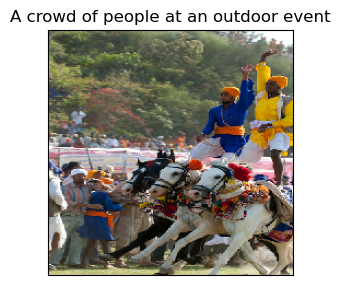

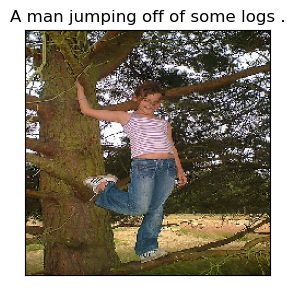

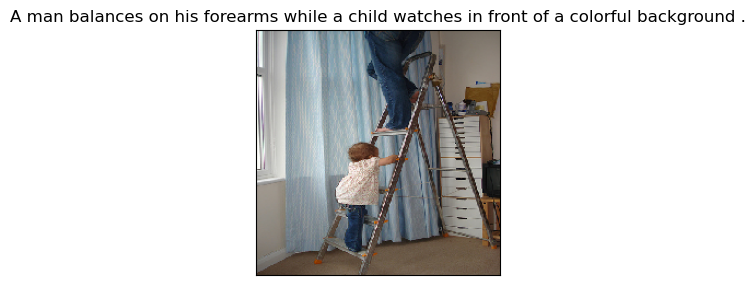

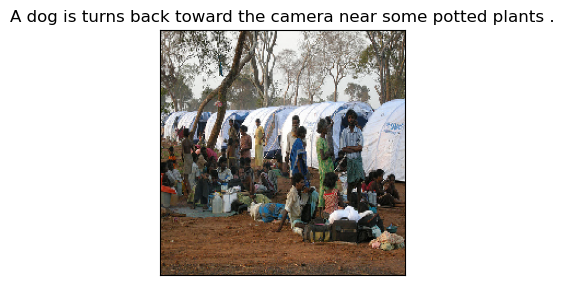

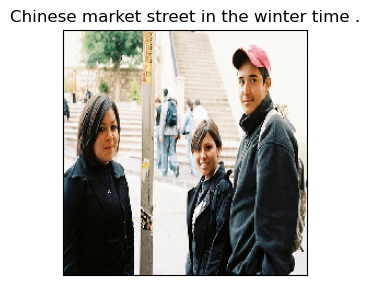

...

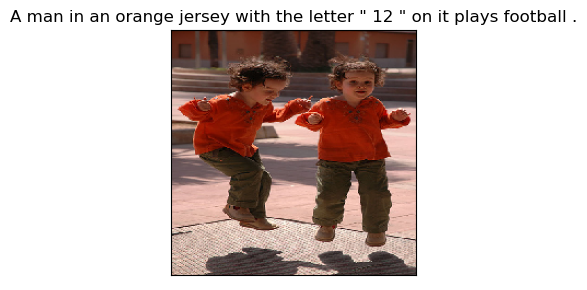

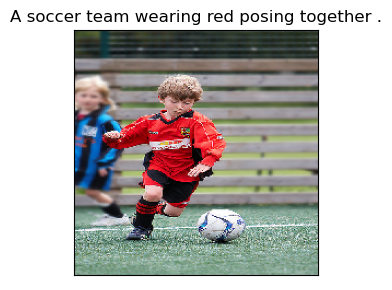

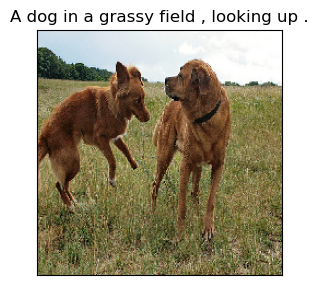

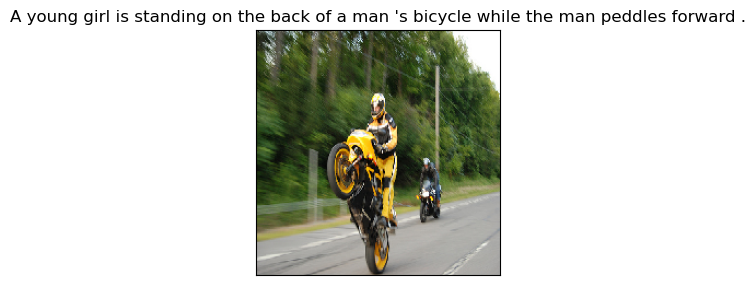

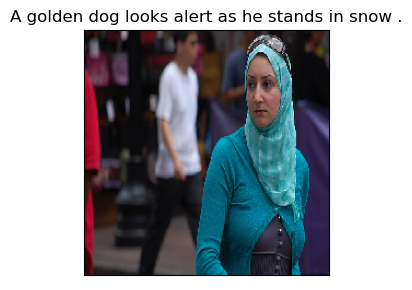

In [16]:
# передаем переменным параметры учебного набора данных

path = path_train_images
df = train_dataset
fot(imag(df, path))

В учебном наборе загрузчик нашел 5822 подтвержденных имен файлов изображений, не по всем из них описания соответствуют тому что изображено.

Found 500 validated image filenames.


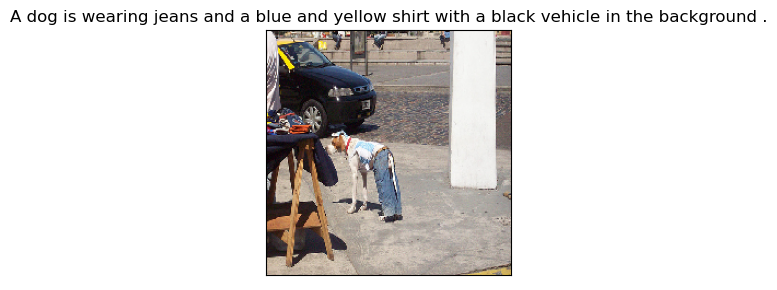

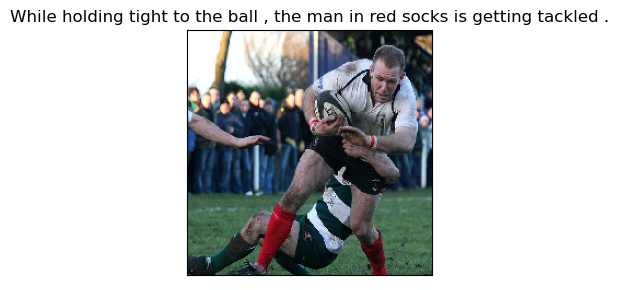

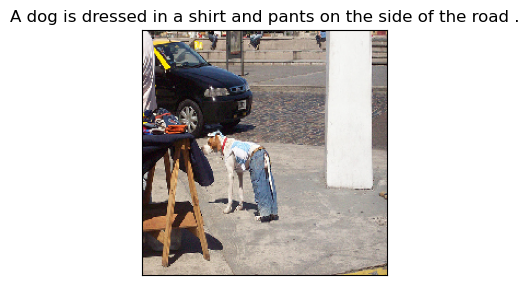

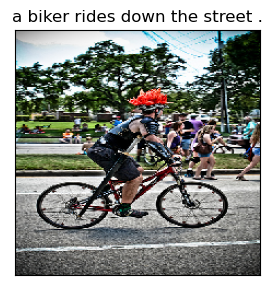

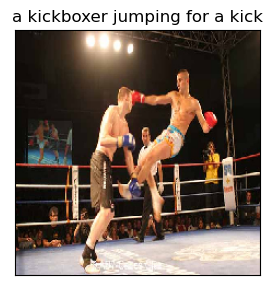

...

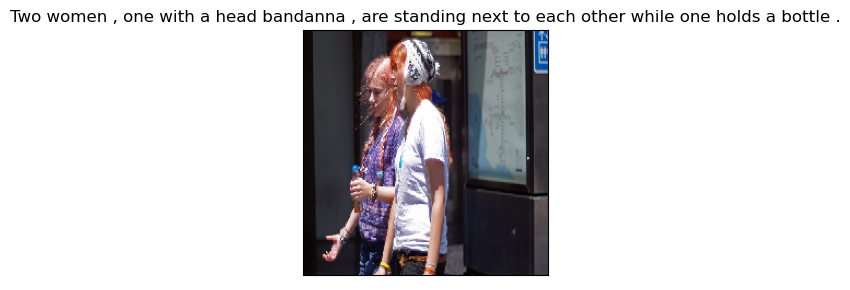

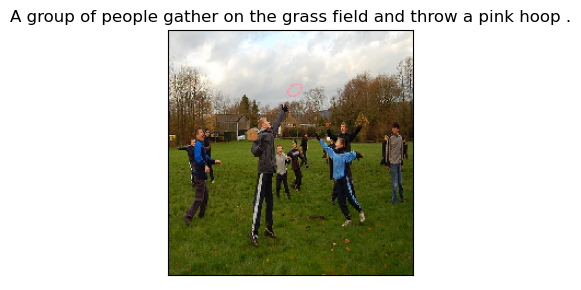

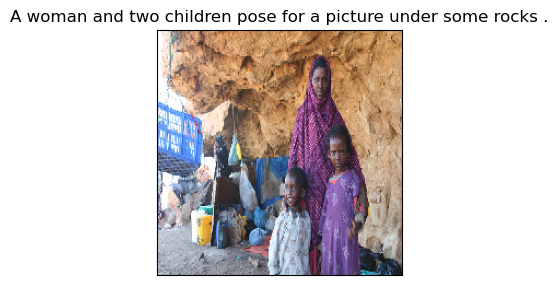

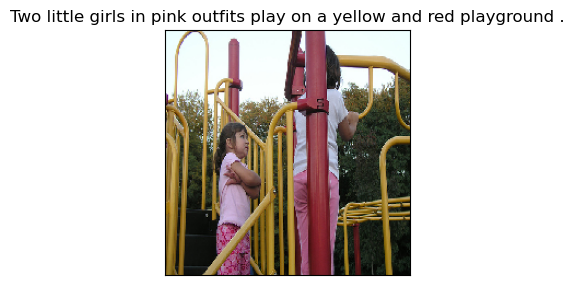

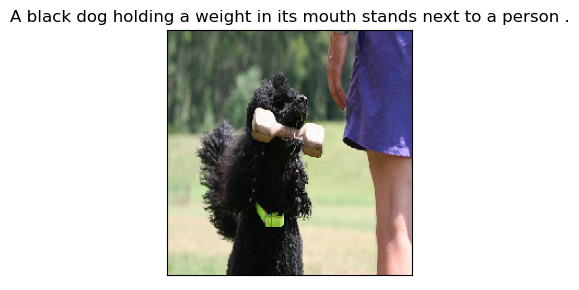

In [17]:
path = "test_images"
df = test_queries
fot(imag(df, path))

В тестовом наборе загрузчик нашел 500 подтвержденных имен файлов изображений, также не по всем из них описания соответствуют тому что изображено.

### Получение средней оценки

#### Обработка экспертных оценок

Для сохранения первоначальных данных создаем копию набора фрейма с экспертными оценками ExpertAnnotations, с которой и будем работать

In [18]:
expert = ExpertAnnotations.copy()
expert.head()

,image,query_id,exp1,exp2,exp3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


Проверяем наличие аномальных значений в экспертных оценках

In [19]:
print(expert['exp1'].sort_values().unique())
print(expert['exp2'].sort_values().unique())
print(expert['exp3'].sort_values().unique())

[1 2 3 4]
[1 2 3 4]
[1 2 3 4]


Аномальные значения отсутствуют.

Исследуем оценки первого эксперта

In [20]:
print(expert['exp1'].value_counts())
print('')
print('Доля изображений, по мнению 1 эксперта, совершенно не соответствующих запросу:',
    round((expert.query('exp1 == 1')['exp1'].count()/(expert['exp1'].count())*100),1),'%')

1    4120
2    1109
3     346
4     247
Name: exp1, dtype: int64

Доля изображений, по мнению 1 эксперта, совершенно не соответствующих запросу: 70.8 %


Исследуем оценки второго эксперта

In [21]:
print(expert['exp2'].value_counts())
print('')
print('Доля изображений, по мнению 2 эксперта, совершенно не соответствующих запросу:',
    round((expert.query('exp2 == 1')['exp2'].count()/(expert['exp2'].count())*100),1),'%')

1    3327
2    1666
3     518
4     311
Name: exp2, dtype: int64

Доля изображений, по мнению 2 эксперта, совершенно не соответствующих запросу: 57.1 %


Исследуем оценки третьего эксперта

In [22]:
print(expert['exp3'].value_counts())
print('')
print('Доля изображений, по мнению 3 эксперта, совершенно не соответствующих запросу:',
    round((expert.query('exp3 == 1')['exp3'].count()/(expert['exp3'].count())*100),1),'%')

1    2350
2    2222
3     837
4     413
Name: exp3, dtype: int64

Доля изображений, по мнению 3 эксперта, совершенно не соответствующих запросу: 40.4 %


Пишем функцию для создания столбца итоговой экспертной оценки по принципу "голосования по большинству" - итоговой является оценка, которую выставило большинство экспертов, если все эксперты поставили разные оценки - ставится значение None

In [23]:
def agg_exp(row):
    if (row['exp1'] == row['exp2']
    or row['exp1'] == row['exp3']):
        return row['exp1']
    if row['exp2'] == row['exp3']:
        return row['exp2']
    else:
        return None
expert['agg_exp'] = expert.apply(agg_exp, axis=1)


In [24]:
expert.head()
expert.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     5822 non-null   object 
 1   query_id  5822 non-null   object 
 2   exp1      5822 non-null   int64  
 3   exp2      5822 non-null   int64  
 4   exp3      5822 non-null   int64  
 5   agg_exp   5696 non-null   float64
dtypes: float64(1), int64(3), object(2)
memory usage: 273.0+ KB


In [25]:
print('Список итоговых оценок экспертов:', expert['agg_exp'].sort_values().unique())
print('Отсутствуют итоговые оценки экспертов:',expert['agg_exp'].isna().sum())

Список итоговых оценок экспертов: [ 1.  2.  3.  4. nan]
Отсутствуют итоговые оценки экспертов: 126


Исключаем строки, в которых отсутствуют итоговые оценки экспертов и проверим оставшиеся значения.

In [26]:
expert = expert.dropna()
print('Список итоговых оценок экспертов:', expert['agg_exp'].sort_values().unique())
print('')
print(expert['agg_exp'].value_counts())

Список итоговых оценок экспертов: [1. 2. 3. 4.]

1.0    3327
2.0    1566
3.0     492
4.0     311
Name: agg_exp, dtype: int64


Для удобства работы проведем декомпозицию датафрейма с оценками экспертов, в котором оставим столбцы 'image', 'query_id', 'agg_exp'.

В соответствии с условием проекта оценочные значения изображений должны иметь значения от 0 до 1, при этом оценка эксперта принимается с коэффициентом 0.6.

Для выведения итоговой экспертной оценки напишем функцию, которая присвоит экспертным оценкам условные значения от 0 до 1 с равными промежутками между значениями, где:
-  0 - соответствует экспертной оценке со значением 1,
-  1 - со значением 4,
-  0.33 - со значением 2,
-  0.67 - со значением 3.

Каждое условное значение умножим на 0.6

In [27]:
expert = expert[['image', 'query_id', 'agg_exp']] # Создаем новый датафрейм
expert.head()

,image,query_id,agg_exp
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1.0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,2.0
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1.0


In [28]:
# Пишем функию

def coef(row):
    if row['agg_exp'] == 1:
        return 0
    if row['agg_exp'] == 2:
        return 0.33*0.6
    if row['agg_exp'] == 3:
        return 0.67*0.6
    if row['agg_exp'] == 4:
        return 0.6

expert['agg_exp'] = expert.apply(coef, axis=1)

In [29]:
expert.head()

,image,query_id,agg_exp
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.198
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000


Установим долю изображений, которые по мнению "голосования по большинству" экспертов совершенно не соответствуют запросу.

In [30]:
print('Доля изображений, по усередненному экспертному мнению, совершенно не соответствующих запросу:',
    round((expert.query('agg_exp == 0')['agg_exp'].count()/(expert['agg_exp'].count())*100),1),'%')

Доля изображений, по усередненному экспертному мнению, совершенно не соответствующих запросу: 58.4 %


<b>Вывод:</b> Мы исследовали экспертную оценку соответствия поискового запроса (описания изображения) тому, что изображено на фотографии. Изображения были оценены тремя экспертами. Самым взыскательным оказался первый эксперт, по оценке которого  70.8 % изображений не соответствуют запросу, по мнению второго  - не соответствует 57.1 %, самым лояльным является третий эксперт, по мнению которого полное несоответствие имеется по  40.4 % изображений.

Для получения единой оценки о соответствии мы применили метод "голосования по большинству", согласно которому изображению присваивается та оценка соответствия, которую выставили большинство экспертов (написана функция). Изображения, по которым все оценки разнятся (126), исключены из датафрейма.  
    
Также для формирования единых экспертных оценок, к последним применена классификация от 0 до 1 в порядке возрастания соответствия: значения 0, 0.33, 0.67, 1, которые умножены на коэффициент 0.6. По мнению большинства экспертов 58.4 % изображений не соответствуют имеющемуся описанию.
    
Сформирован новый датафрейм  с именами файлов изображений, идентификаторами описаний изображений и агрегированными экспертными оценками в диапазоне от 0 до 1.   

#### Обработка краудсорсинговых оценок

Для сохранения первоначальных данных создаем копию набора фрейма с краудсорсинговыми оценками CrowdAnnotations, с которой будем работать далее.

In [31]:
crow = CrowdAnnotations.copy()
crow.head()

,image,query_id,part_agree,sum_agree,sum_not_agree
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


Исследуем данные краудсорсинговых оценок, применив функцию value_counts(), которая расположит в порядке убывания уникальные значения столбцов, содержащих  данные о доли лиц, подтвердивших соответствие описания картинке, а также количестве лиц, подтвердивших соответствие и несоответствие описания изображению.

In [32]:
print('Доля исполнителей, подтвердивших, что текст соответствует картинке')
print(crow['part_agree'].value_counts())
print('')
print('Количество исполнителей, подтвердивших, что текст соответствует картинке')
print(crow['sum_agree'].value_counts())
print('')
print('Количество исполнителей, подтвердивших, что текст не соответствует картинке')
print(crow['sum_not_agree'].value_counts())

Доля исполнителей, подтвердивших, что текст соответствует картинке
0.000000    41970
0.333333     3000
0.666667     1360
1.000000     1323
0.250000       96
0.500000       27
0.200000       22
0.750000        9
0.600000        8
0.400000        8
0.800000        4
0.166667        3
Name: part_agree, dtype: int64

Количество исполнителей, подтвердивших, что текст соответствует картинке
0    41970
1     3119
2     1394
3     1328
4       14
5        5
Name: sum_agree, dtype: int64

Количество исполнителей, подтвердивших, что текст не соответствует картинке
3    41219
2     3034
1     1371
0     1323
4      665
5      176
6       42
Name: sum_not_agree, dtype: int64


In [33]:
print('Доля изображений, по которым ни один из краудов не подтвердил соответствие описанию составляет',
    round((crow.query('part_agree == 0')['part_agree'].count()/(crow['part_agree'].count())*100),1),'%')

Доля изображений, по которым ни один из краудов не подтвердил соответствие описанию составляет 87.7 %


Без дополнительной визуализации видно, что подавляющее большинство изображений, по оценке краудов, не соответствует описанию. В 87.7% случаев ни один из исполнителей не подтвердил соответствие.

По условию проекта нам необходимо мнения краудов относительно изображений облечь в форму оценок (по аналогии с мнением экспертов). Сделаем это по столбцу 'part_agree' - доля исполнителей, подтвердивших, что текст соответствует картинке. Логика такова: в тех случаях, где эта доля равна  0 - никто не подтвердил соответствие, далее - по нарастающей. Чем выше доля - тем большее количество оценщиков подтвердило соответствие, 1 - все подтвердили идентичность изображения. В соответствии с условием проекта умножим эти значения на 0.4.

Таким образом мы сохраним условие - оценка в пределах от 0 до 1, чем выше значение - тем больше соответствие (такой принцип также следует логике установленной нами оценки экспертов - чем выше оценка - тем большее соответствие).

Для наглядности и удобства также проведем декомпозицию датафрейма.

In [34]:
crow = crow[['image', 'query_id', 'part_agree']] # Создаем новый датафрейм
crow.head()

,image,query_id,part_agree
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0


In [35]:
crow['part_agree'] = crow['part_agree']*0.4 # Получаем краудсорсинговые оценки
crow.head()

,image,query_id,part_agree
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,0.4
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0


 <b>Вывод:</b> Исследование краудсорсинговых оценок показало, что подавляющее большинство изображений, как и по оценке экспертов, не соответствует описанию. В 87.7% случаев ни один из исполнителей не подтвердил соответствие. Данные об оценке краудов получены путем применения к показателю доли оценщиков, подтвердивших соответствие изображения описанию, коэффициента 0.4. Оценки сформированы от  0 (изображение не соответствует описанию) в порядке возрастания соответствия.  

#### Получение значений целевой переменной

Для получения единой оценки экспертов и краудов, объединим созданные нами датафреймы и создадим столбец с суммой оценок по обеим системам.

Объединение проведем по столбцам 'image','query_id'. В датафрейме с экспертными оценками содержится 5696 объектов (после применения "голосования по большинству), что почти на порядок меньше, чем в датафрейме с оценками краудов (47830). Вместе с тем, в наборе данных train_dataset, с которым нам предстоит объединить файл с целевой переменной и где собрана информация, необходимая для обучения, как и в исходном файле с экспертными оценками содержится  5822 объекта.

Значит объединение фреймов экспертов и краудов проведем таким образом, чтоб у нас вошли все данные по меньшему датафрейму, поскольку если недостающие оценки экспертов еще можно восполнить с определенной долей погрешности, то описания изображений, данных в  столбце query_text набора данных train_dataset мы не восполним.

In [36]:
exp_crow = expert.merge(crow, on = ['image','query_id'], how = 'left')

Применим функцию для изучения нового объединенного датафрейма

In [37]:
study(exp_crow)

,image,query_id,agg_exp,part_agree
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000,0.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000,0.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.198,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000,NaN


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5696 entries, 0 to 5695
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5696 non-null   object 
 1   query_id    5696 non-null   object 
 2   agg_exp     5696 non-null   float64
 3   part_agree  2258 non-null   float64
dtypes: float64(2), object(2)
memory usage: 222.5+ KB

Найдено пропусков:
image            0
query_id         0
agg_exp          0
part_agree    3438
dtype: int64

Найдено дубликатов: 0


Мы создали датафрейм, в который вошли все данные из набора с экспертными оценками. При этом 3438 изображений с идентификаторами описаний не подвергались оценке краудов. Чтоб восполнить пробелы изучим распределение данных по столбцу part_agree.

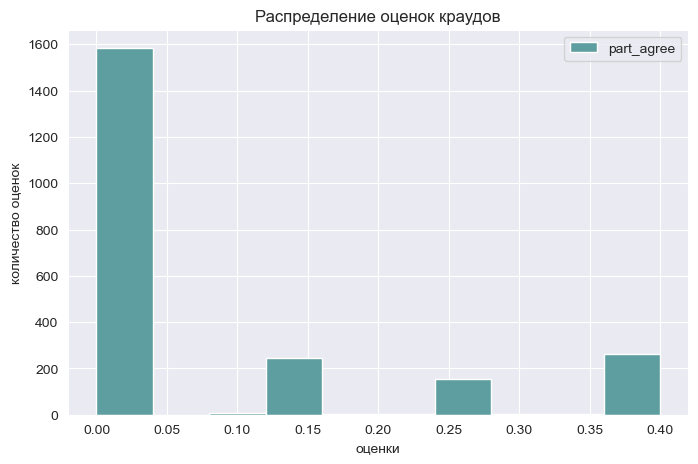

In [38]:
sns.set_style('darkgrid')
fig, ax = plt.subplots(1, 1)
exp_crow['part_agree'].hist(bins= 10, grid = True, legend = 'part_agree', color='cadetblue',figsize = (8,5))
ax.set_title("Распределение оценок краудов")
ax.set_xlabel('оценки')
ax=ax.set_ylabel('количество оценок')

In [39]:
exp_crow['part_agree'].describe()

count    2258.000000
mean        0.079991
std         0.138302
min         0.000000
25%         0.000000
50%         0.000000
75%         0.133333
max         0.400000
Name: part_agree, dtype: float64

In [40]:
exp_crow['part_agree'].value_counts()

0.000000    1584
0.400000     261
0.133333     243
0.266667     153
0.100000       5
0.200000       4
0.080000       2
0.160000       2
0.320000       2
0.300000       2
Name: part_agree, dtype: int64

Как видно, подавляющее значение известных в объединенном датасете оценок краудов  - 0, медианное значение тоже равно 0. Кроме того, как мы установили, в созданном нами  датасете с краудсорсинговыми оценками почти 90% из них равнялось 0. Значит в объединенном датасете пропуски в оценках краудов заменим медианным значением.

In [41]:
exp_crow['part_agree'] = exp_crow['part_agree'].fillna(exp_crow['part_agree'].median()) # заменяем на медиану
study(exp_crow) # проверяем замену

,image,query_id,agg_exp,part_agree
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000,0.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000,0.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000,0.0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.198,0.0
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000,0.0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5696 entries, 0 to 5695
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5696 non-null   object 
 1   query_id    5696 non-null   object 
 2   agg_exp     5696 non-null   float64
 3   part_agree  5696 non-null   float64
dtypes: float64(2), object(2)
memory usage: 222.5+ KB

Найдено пропусков:
image         0
query_id      0
agg_exp       0
part_agree    0
dtype: int64

Найдено дубликатов: 0


Пропуски заменены, теперь сформируем единую оценку соответствия описания путем сложения экспертной и краудсорсинговой оценки и исключим лишние столбцы

In [42]:
exp_crow['target_variable'] = exp_crow['agg_exp']+exp_crow['part_agree']
exp_crow = exp_crow[['image', 'query_id', 'target_variable']]
exp_crow.head()

,image,query_id,target_variable
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.198
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000


Исследуем данные о полученных оценках

In [43]:
print('Количество уникальных оценок изображений:', len(np.unique(exp_crow['target_variable'].unique())))

Количество уникальных оценок изображений: 23


Выведем описание столбца с итоговыми оценками

In [44]:
exp_crow['target_variable'].describe()

count    5696.000000
mean        0.153629
std         0.250317
min         0.000000
25%         0.000000
50%         0.000000
75%         0.198000
max         1.000000
Name: target_variable, dtype: float64

Размеры оценок находятся в пределах от 0 (минимальная) до 1 (максимальная), что соответствует условию проекта относительно целевой переменной.

In [45]:
print('Доля изображений, по которым итоговая оценка не подтверждает соответствие описанию составляет',
    round((exp_crow.query('target_variable == 0')['target_variable'].count()/(exp_crow['target_variable'].count())*100),1),'%')

Доля изображений, по которым итоговая оценка не подтверждает соответствие описанию составляет 58.3 %


 <b>Вывод:</b> Мы сформировали датафрейм, содержащий имя файла изображения, идентификатор описания и целевую переменную в значениях от 0 (изображение полностью не соответствует описанию) до 1 (запрос и текст соответствуют полностью. Доля изображений, не соответствующих описанию, составляет 58.3 %, что ближе к оценке "голосования по большинству", полученной на основе мнения экспертов.

## Проверка данных

Перед тем, как объединить учебный датасет с exp_crow, в котором содержится целевая переменная, в соответствии с условием проекта удалим из учебного набора данных объекты, содержащие изображения детей. Такие объекты найдем на основании описания в столбце query_text.

Для сохранения первоначальных данных создаем копию набора учебного датасета train_dataset, с которой будем работать.

In [46]:
train_worker = train_dataset.copy()
train_worker.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [47]:
baby = ['child','girl', 'Girl' ,'Boy',
        'boy','baby', 'babies','children','schoolchild','teenager','teen','kid','infant','youngster']

In [48]:
train_worker = train_worker[~train_dataset.query_text.str.contains('|'.join(baby))]

In [49]:
train_worker.head()

,image,query_id,query_text
22,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .
23,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .
24,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .
25,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .
26,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .


Посмотрим на изображения и исследуем датафрейм

Found 4309 validated image filenames.


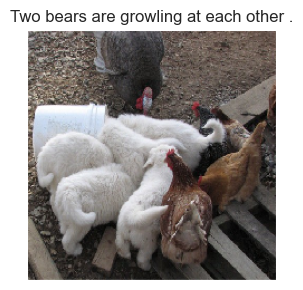

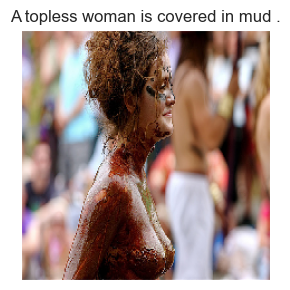

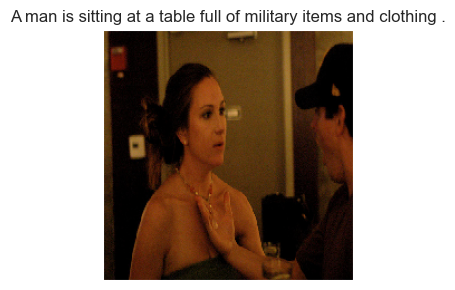

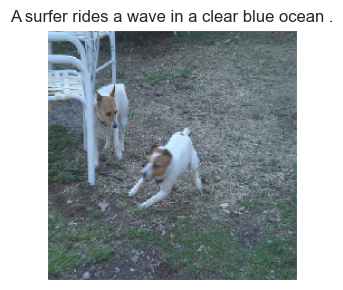

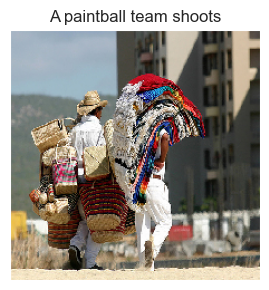

...

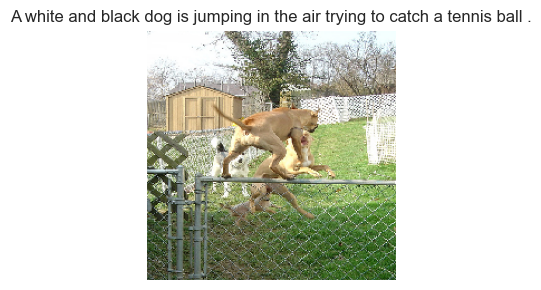

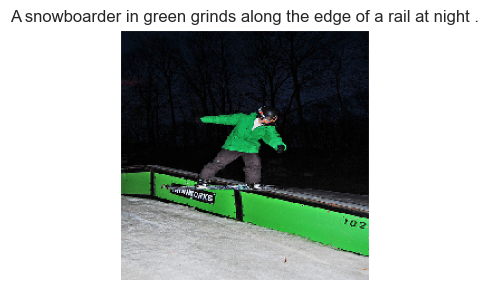

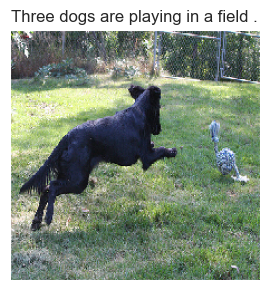

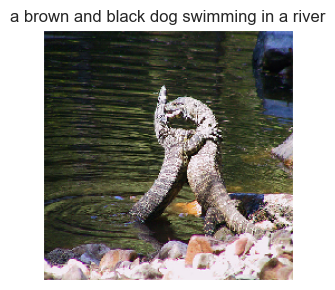

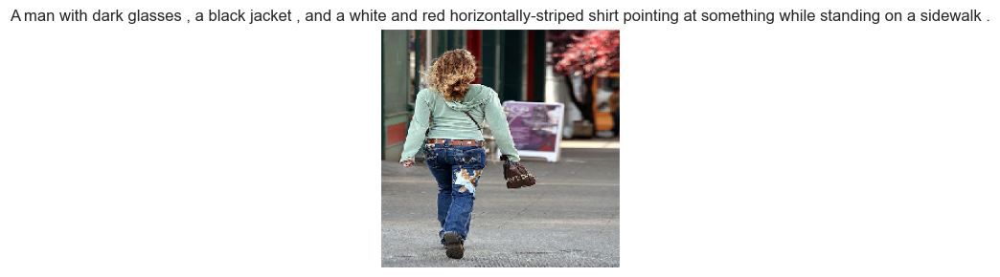

In [51]:
path = path_train_images
df = train_worker
fot(imag(df, path))

Загрузчик нашел 4309 изображений, которые не должны содержать изображений детей, но которые все еще имеют место быть. Скорее всего это связано с погрешностью описания, которое не содержит указания на наличие детей на изображении. Недаром по большинству фотографий эксперты и крауды признали несоответствие описания фактическому изображению.

In [52]:
train_worker.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4309 entries, 22 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       4309 non-null   object
 1   query_id    4309 non-null   object
 2   query_text  4309 non-null   object
dtypes: object(3)
memory usage: 134.7+ KB


После удаления объектов, содержащих изображения детей, в наборе данных осталось 4309 строк. Теперь объединим его с датафреймом, содержащим целевую переменную. Поскольку в наборе данных с информацией для обучения объектов меньше (4309), чем в данных с целевой переменной (5696), а описания фото мы адекватно не восполним, объединение выполним таким образом, чтоб итоговый датафрейм вошли все объекты из учебного набора train_worker

In [53]:
all_df = train_worker.merge(exp_crow, on = ['image','query_id'], how = 'left')

In [54]:
study(all_df) # проверяем корректность объединения

,image,query_id,query_text,target_variable
0,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000
1,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.198
2,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.198
3,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.198
4,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000


<class 'pandas.core.frame.DataFrame'>
Int64Index: 4309 entries, 0 to 4308
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            4309 non-null   object 
 1   query_id         4309 non-null   object 
 2   query_text       4309 non-null   object 
 3   target_variable  4218 non-null   float64
dtypes: float64(1), object(3)
memory usage: 168.3+ KB

Найдено пропусков:
image               0
query_id            0
query_text          0
target_variable    91
dtype: int64

Найдено дубликатов: 0


In [55]:
all_df = all_df.dropna()
study(all_df) # проверяем данные

,image,query_id,query_text,target_variable
0,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000
1,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.198
2,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.198
3,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.198
4,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000


<class 'pandas.core.frame.DataFrame'>
Int64Index: 4218 entries, 0 to 4308
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            4218 non-null   object 
 1   query_id         4218 non-null   object 
 2   query_text       4218 non-null   object 
 3   target_variable  4218 non-null   float64
dtypes: float64(1), object(3)
memory usage: 164.8+ KB

Найдено пропусков:
image              0
query_id           0
query_text         0
target_variable    0
dtype: int64

Найдено дубликатов: 0


 <b>Вывод:</b> В соответствии с условием проекта мы удалили из датасета с информацией для обучения объекты, в которых описания изображений содержали указание на то, что на фотографии дети (использовали для этого функцию str.contains()).  В наборе данных осталось 4309 строк, однако все еще попадаются изображения детей, что может быть  связано с погрешностью описания, которое не содержит указания на наличие детей на изображении. Данный датафрейм объединен с  датафреймом, содержащим целевую переменную. После объединения из набора исключен 91 объект, содержащий пропуски в описании данных. После всех преобразований осталось 4218 объекта.  

## Векторизация изображений

Для векторизации изображений используем предобученную модель ResNet50, которую мы импортировали из библиотеки Keras и на основе которой построим модель, которой на вход передадим изображения, а в качестве предсказаний получим векторы.

In [56]:
# Загружаем изображения

def imag(df, path):
    datagen = ImageDataGenerator(rescale=1./255)
    flow = datagen.flow_from_dataframe(
        dataframe= df,
        directory= PATH+path,
        x_col='image',
        y_col='query_text',
        target_size=(224, 224),
        batch_size=16,
        class_mode='raw',
        seed=12345)
    return flow

# Загружаем предобученную модель ResNet50
def create_model(input_shape=(224, 224, 3)):

    optimizer = Adam(lr=0.0001)

    backbone = ResNet50(input_shape=input_shape,
                    weights='imagenet',
                    include_top=False)


    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())


    model.compile(optimizer=optimizer,
                  loss='mean_squared_error',
                  metrics=['mae'])

    return model

# Получаем векторы изображений
def vect_imag(model,flow):
    predict = model.predict(flow)
    return predict

Передаем переменным функции аргументы - путь, где находятся изображения, имя датафрейма и в качестве предсказаний получаем векторы изображений.

In [57]:
path = path_train_images
df = all_df
predictions = vect_imag(create_model(), imag(df, path))

C:\Users\User\anaconda3\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Found 4218 validated image filenames.
264/264 [==============================] - 183s 689ms/step


Проверим размер данных

In [58]:
predictions.shape

(4218, 2048)

Для контроля посмотрим на один из тензоров

In [59]:
print(predictions[0])

[0.         0.         0.00432846 ... 2.7096615  0.         0.        ]


 <b>Вывод:</b> Для векторизации изображений мы написали функцию с использованием предобученной модели ResNet50, с помощью которой построили модель, преобразующую фотографии в вектора и которой передали изображения из сформированного набора данных с информацией для обучения. В результате работы модели получили набор данных, содержащий 4218 объектов с векторизованными изображениями, которые из трехмерных тензоров на входе (224, 224, 3) превратились в одномерные размером 2048.

## Векторизация текстов

Теперь нам необходимо векторизовать словесное описание изображение. Данная работа является обработкой  естественного языка, для чего мы импортировали библиотеки nltk, re и необходимые модули из них. Для начала мы очистим текст от лишних символов, цифр, приведем все слова к нижнему регистру, разобъем его на токены (слова), удалим слова, не несущие смысловой нагрузки (стоп-слова) и лемматизируем текст (приведем слова к начальной форме). Для всех этих действий напишем специальные функци, которые применим к столбцу с текстами.

После этих действий конвертируем тексты методом TfidfVectorizer().

Пишем функцию для "очистки" текста

In [60]:
stop_words = set(stopwords.words('english'))
stop_words.remove('not')

def data_preprocessing(text):
    text =  re.sub(r"[^a-zA-Z]", ' ', text) # оставляем только буквы латинского алфавита
    text = text.strip() #убирание первого и последнего пробела
    text = re.sub(r' {1,10}', ' ', text) #замена множественных пробелов на один
    text = nltk.word_tokenize(text) # разбиваем на токены
    text = [word for word in text if word not in stop_words] # убираем стоп-слова английского языка
    text = " ".join(text) # объединяем элементы в строку
    return text # возвращаем преобразованный текст

Смотрим на примере одного описания каков текст в первоначальном виде

In [61]:
all_df['query_text'][0]

'A man sleeps under a blanket on a city street .'

Применяем функцию к столбцу с тексом, заменяя его очищенными данными

In [62]:
all_df['query_text']= all_df['query_text'].apply(data_preprocessing)

Смотрим как изменился текст после работы функции data_preprocessing

In [63]:
all_df['query_text'][0]

'A man sleeps blanket city street'

Пишем функцию для лемматизации

In [64]:
lemmatizer = WordNetLemmatizer()

def get_wordnet_pos(word):
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

def lemmatiz(text):
    return " ".join([lemmatizer.lemmatize(w.lower(), get_wordnet_pos(w)) for w in nltk.word_tokenize(text)])

Применим ее к столбцу датафрейма с текстами.

In [65]:
all_df['query_text'] = all_df['query_text'].progress_apply(lemmatiz)

  0%|          | 0/4218 [00:00<?, ?it/s]

Проверяем как изменился текст с индексом [0]

In [66]:
all_df['query_text'][0]

'a man sleep blanket city street'

Текст разбит на отдельные слова в нижнем регистре, не содержит цифры, знаки препинания, символы.

Конвертируем текст столбца query_text методом TfidfVectorizer().

In [67]:
#nltk.download('stopwords')
stopwords = set(nltk_stopwords.words('english'))

corpus = all_df['query_text']
count_tf_idf = TfidfVectorizer(stop_words=list(stopwords))
tf_idf_train = count_tf_idf.fit_transform(corpus)

Проверим результат конвертации: количество документов и количество токенов (слов), а также данные об объекте

In [68]:
print("Размер матрицы:", tf_idf_train.shape)
print('')
print(tf_idf_train[0])
print('')
print('Тип объекта:')
tf_idf_train

Размер матрицы: (4218, 953)

  (0, 806)	0.33115763227287026
  (0, 152)	0.3916840938667542
  (0, 82)	0.589920289910292
  (0, 748)	0.589920289910292
  (0, 465)	0.2022530501711168

Тип объекта:


<4218x953 sparse matrix of type '<class 'numpy.float64'>'
	with 24719 stored elements in Compressed Sparse Row format>

Мы получили объект формате csr (разреженных матриц с сжатым хранением строкой), который для создания вектора с векторизованными изображениями необходимо преобразовать в массив Numpy. Применим для этого метод toarray().

In [69]:
tf_idf_train = tf_idf_train.toarray()
print("Размер матрицы:", tf_idf_train.shape)

Размер матрицы: (4218, 953)


Мы векторизовали описания фотографий, преобразовав их в массив Numpy, который можно объединять с векторизованными  изображениями.

 <b>Вывод:</b> Мы преобразовали словесные описания фотографий в вектора методом TfidfVectorizer(), предварительно обработав тексты: очистили от лишних символов, цифр, привели к нижнему регистру, разбили токены (слова), удалили стоп-слова, лемматизировали. Всего получили 4218 объектов по 953 тензора в каждом.

## Объединение векторов

В результате векторизации изображений и текстов мы получили два набора признаков размером (4218, 2048) - изображения и (4218, 953) - их описания, где 4218 - количество объектов и размеры векторов. Для объединения массивов, полученных в результате векторизации изображений и текстов применим функцию numpy.concatenate(), задав axis=1, которая вернет [ndarray] объединенный массив.

In [70]:
union_vector = np.concatenate((predictions, tf_idf_train), axis=1)

Узнаем размер матрицы и посмотрим на один из векторов

In [71]:
print('Размер матрицы:', union_vector.shape)
print('')
print(union_vector[0])

Размер матрицы: (4218, 3001)

[0.         0.         0.00432846 ... 0.         0.         0.        ]


После объединения векторов изображений и текстов мы получили набор признаков - 4218 объектов конкатенированных векторов размером 3001.

Для дальнейшей работы переведем в векторный формат созданный нами набор целевых принаков, содержащийся в столбце target_variable.

In [72]:
target = np.array(all_df['target_variable'])
print(target.shape)
print('')
target

(4218,)



array([0.   , 0.198, 0.198, ..., 0.198, 0.402, 0.   ])

 <b>Вывод:</b> В результате векторизации изображений и текстов мы получили два набора признаков размером (4218, 2048) - изображения и (4218, 953) - их описания, где 4218 - количество объектов и размеры векторов. Данные массивы объединены функцией concatenate(), получен набор признаков, состоящий из 4218 объектов размером 3001.
    
Целевой признак, также состоящий из 4218 объектов переведен массив array.

## Обучение модели предсказания соответствия

Для обучения разделим датасет на тренировочную и тестовую выборки. Для исключения попадания изображения в обучающую и тестовую выборки одновременно воспользуемся классом GroupShuffleSplit из библиотеки sklearn.model_selection, которые мы импортировали. Разобьем датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'image' будут содержаться либо в тестовом, либо в тренировочном датасете.

In [73]:
groups = all_df['image']

In [74]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=12345)

train_indices, test_indices = next(gss.split(X=union_vector, y=target, groups=groups))
features_train, features_test = union_vector[train_indices], union_vector[test_indices]
target_train, target_test = target[train_indices], target[test_indices]


Проверяем размеры выборок

In [75]:
print(features_train.shape, features_test.shape, target_train.shape, target_test.shape)

(2943, 3001) (1275, 3001) (2943,) (1275,)


Данные разделились корректно, перейдем к построению моделей.

### Определение метрики качества

Перед нами стоит задача предсказания соответствия текста и картинки, наша модель должна выводить несколько фотографий, соответствующих описанию.

Для решения этой задачи подходит построение моделей линейной регрессии, а также нейросетей с помощю таких фреймворков как  Keras, TensorFlow.

Наиболее популярными метриками для непрерывных переменных являются MSE (среднеквадратичная ошибка (Mean Squared Error)), RMSE (корень из среднеквадратичной ошибки (Root Mean Squared Error)) и  MAE (средняя абсолютная ошибка (Mean Absolute Error)).

При выборе метрики качества будем исходить из следующего.

Достоинство RMSE в простоте  интерпретации, поскольку она измеряется в тех же единицах, что и целевая переменная. Недостатком данной метрики является  тенденция к занижению  качества модели, чувствительность к выбросам. Но занижать - не завышать, а  MSE тоже чувствительна к выбросам, однако интерпретировать ее сложнее из-за квадратичной зависимости.

MAE оказывается менее чувствительна к выбросам в данных, но, как описано в источниках, на практике MAE более подходит  в качестве общей меры ошибки прогноза в анализе временных рядов.

В указанной связи метрикой качества линейной регрессии изберем  RMSE, на снижение которой будем ориентироваться.


### Модели линейной регрессии

<b>RidgeCV</b>

В соответствии с условием проекта необходимо построить модель линейной регрессии. Построим вариацию линейной регрессии -  гребневую регре́ссию, для которой будем использовать функцию RidgeCV() с функцией RepeatedKFold () для выполнения k-кратной перекрестной проверки, аналогичной GRIDSearchCV, чтобы найти оптимальное значение альфа.  

In [76]:
cv = RepeatedKFold(n_splits= 10 , n_repeats= 3 , random_state= 12345)
model_rcv = RidgeCV(alphas = [0.1, 1.0, 10], cv=cv, scoring='neg_root_mean_squared_error')
result_rcv = model_rcv.fit(features_train, target_train)

In [77]:
print('Лучший параметр alphas:',result_rcv.alpha_, 'лучший RMSE:',abs(round((result_rcv.best_score_),3)))

Лучший параметр alphas: 10.0 лучший RMSE: 0.254


<b>LinearSVR</b>

Попробуем построить модель линейной регрессии опорных векторов LinearSVR

In [78]:
model = LinearSVR(random_state=12345)

param = {
    'loss':['squared_epsilon_insensitive'],
    'C':[0.1, 1, 10]
}

model_svr = GridSearchCV(
    model,
    param,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1,
    verbose=1
)

In [79]:
model_svr.fit(features_train, target_train)

Fitting 5 folds for each of 3 candidates, totalling 15 fits


C:\Users\User\anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


GridSearchCV(estimator=LinearSVR(random_state=12345), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10],
                         'loss': ['squared_epsilon_insensitive']},
             scoring='neg_root_mean_squared_error', verbose=1)

In [80]:
print('Лучшие параметры:',model_svr.best_estimator_, 'лучший RMSE:',abs(round((model_svr.best_score_),3)))

Лучшие параметры: LinearSVR(C=0.1, loss='squared_epsilon_insensitive', random_state=12345) лучший RMSE: 0.257


Метрики качества линейных моделей RidgeCV() и LinearSVR() не сильно отличаются и составили 0.254 и 0.257 соответственно.

### Модели keras

Построим две полносязные нейросети средствами библиотеки keras

<b>model_nn</b>

К модели model_nn мы эксперементально подобрали количество слоев - 5, функции активации - relu, tanh и на выходе linear, оптимизатор Adam, количество эпох обучения - 10, размер батча - 8. После первого, второго и третьего слоев применили Dropout(0.2), в input_shape передадим размер объединенного тензора - 3001.

In [81]:
model_nn = Sequential()
model_nn.add(Dense(512, activation='relu', input_shape=(3001,)))
model_nn.add(BatchNormalization())
model_nn.add(Dropout(0.2))
model_nn.add(Dense(256, activation='tanh'))
model_nn.add(BatchNormalization())
model_nn.add(Dropout(0.2))
model_nn.add(Dense(128, activation='relu'))
model_nn.add(BatchNormalization())
model_nn.add(Dropout(0.2))
model_nn.add(Dense(64, activation='relu'))
model_nn.add(Flatten())
model_nn.add(Dense(1, activation='linear'))


model_nn.compile(loss='mean_squared_error',
                optimizer = Adam(lr=0.0001),
                metrics=[RootMeanSquaredError()])

C:\Users\User\anaconda3\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [82]:
history = model_nn.fit(features_train,
             target_train,
             epochs=10,
             batch_size=8,
             validation_data=(features_test, target_test),
             verbose=2)

Epoch 1/10
368/368 - 4s - loss: 0.6069 - root_mean_squared_error: 0.7790 - val_loss: 0.1439 - val_root_mean_squared_error: 0.3793 - 4s/epoch - 11ms/step
Epoch 2/10
368/368 - 3s - loss: 0.3561 - root_mean_squared_error: 0.5967 - val_loss: 0.1703 - val_root_mean_squared_error: 0.4127 - 3s/epoch - 8ms/step
Epoch 3/10
368/368 - 3s - loss: 0.2598 - root_mean_squared_error: 0.5098 - val_loss: 0.1341 - val_root_mean_squared_error: 0.3662 - 3s/epoch - 8ms/step
Epoch 4/10
368/368 - 3s - loss: 0.2203 - root_mean_squared_error: 0.4694 - val_loss: 0.1319 - val_root_mean_squared_error: 0.3632 - 3s/epoch - 8ms/step
Epoch 5/10
368/368 - 3s - loss: 0.1876 - root_mean_squared_error: 0.4332 - val_loss: 0.1133 - val_root_mean_squared_error: 0.3365 - 3s/epoch - 9ms/step
Epoch 6/10
368/368 - 3s - loss: 0.1636 - root_mean_squared_error: 0.4045 - val_loss: 0.1144 - val_root_mean_squared_error: 0.3382 - 3s/epoch - 9ms/step
Epoch 7/10
368/368 - 3s - loss: 0.1414 - root_mean_squared_error: 0.3761 - val_loss: 0.

Методом evaluate() посмотрим лучшие параметры функции потерь и метрики качества на тестовых данных при обучении

In [83]:
print(model_nn.metrics_names)
print(model_nn.evaluate(features_test, target_test, verbose=0))

['loss', 'root_mean_squared_error']
[0.09530717134475708, 0.30871859192848206]


Для визуализации процесса обучения построим график.

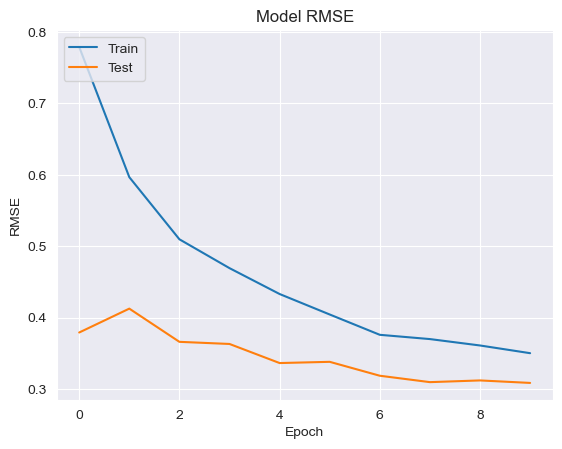

In [84]:
plt.plot(history.history['root_mean_squared_error'])
plt.plot(history.history['val_root_mean_squared_error'])
plt.title('Model RMSE')
plt.ylabel('RMSE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

Избранная нами метрика качества, достигнутая на поносвязной нейронной сети составила 0.295, что несколько выше, чем у моделей  RidgeCV() и LinearSVR() (0.254 и 0.257 соответственно). Поробуем построить нейросеть с перебором гиперпараметров методом GridSearchCV.

<b>Нейросеть с перебором гиперпараметров</b>

Для построения нейросети с перебором гиперпараметров используем конструктор KerasRegressor(), которому в качестве аргумента передадим функцию для создания нейросети, создадим словарь параметров, который передадим в качестве аргумента в GridSearchCV.

In [85]:
# пишем функцию для создания нейросети

def build_clf(unit):
    ann = tf.keras.models.Sequential()
    ann.add(tf.keras.layers.Dense(units=unit, activation='relu'))
    ann.add(tf.keras.layers.Dense(units=unit, activation='relu'))
    ann.add(tf.keras.layers.Dense(units=1, activation='linear'))
    ann.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = [[RootMeanSquaredError()]])
    return ann

# передаем функцию в конструктор KerasRegressor()

model=KerasRegressor(build_fn=build_clf)

# создаем словарь параметров

params={'batch_size':[8, 32, 128],
        'nb_epoch':[10, 100],
        'unit':[5, 10, 15],
        }

# передаем модель и параметры GridSearchCV

model_nn_gs=GridSearchCV(estimator=model, param_grid=params, cv=10)

C:\Users\User\AppData\Local\Temp\ipykernel_12892\2720470695.py:13: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model=KerasRegressor(build_fn=build_clf)


In [86]:
model_nn_gs.fit(features_train, target_train)

10/10 [==============================] - 0s 6ms/step - loss: 0.0678 - root_mean_squared_error: 0.2604


21/21 [==============================] - 0s 2ms/step - loss: 0.1065 - root_mean_squared_error: 0.3263


92/92 [==============================] - 1s 10ms/step - loss: 0.0694 - root_mean_squared_error: 0.2635


GridSearchCV(cv=10,
             estimator=<keras.wrappers.scikit_learn.KerasRegressor object at 0x00000237B9A12400>,
             param_grid={'batch_size': [8, 32, 128], 'nb_epoch': [10, 100],
                         'unit': [5, 10, 15]})

In [87]:
print('Лучшие параметры:',model_nn_gs.best_params_)
print('лучший RMSE:',abs(round((model_nn_gs.best_score_),3)))

Лучшие параметры: {'batch_size': 32, 'nb_epoch': 10, 'unit': 15}
лучший RMSE: 0.067


Метрика RMSE нейросети, построенной с перебором параметров на порядок ниже остальных, построенных нами моделей и составила 0.068, ее работу и протестируем.

 <b>Вывод:</b> мы построили две модели линейной регрессии RidgeCV() и LinearSVR() и две нейросети - с эксперементальным подбором параметров и KerasRegressor() с перебором параметров методом  GridSearchCV. Метрикой качества избрали RMSE, как наиболее просто интерпретируемую и чувствительную к выбросам.
    
Метрики качества линейных моделей не сильно отличаются и составили 0.254 и 0.257 соответственно. Метрика качества нейросети с эксперементальным подбором параметров ниже линейных моделей и составила 0.295. Метрика качества нейросети KerasRegressor(), построенной с перебором параметров методом GridSearchCV на порядок ниже остальных моделей и составила 0.068, ее работу и протестируем.

## Тестирование модели и демонстрация ее работы

Для тестирования модели загрузим изображения из 'test_images', передадим их функции для получения векторов изображений. Далее напишем функцию, которая векторизует текстовое описание изображений для теста, объединт векторы, получит предсказания тестируемой модели на тестовом наборе данных,  сформирует датафрейм из фотографий и предсказаний, распечатает фотографии, соответствующие изображениям. Если в наборе описаний фото встретятся слова, указывающие на изображения детей на фото, предусмотрим алгоритм, выводящий текст: 'This image is unavailable in your country in compliance with local laws'.   

In [88]:
# загружаем изображения тестовой выборки

test_datagen = ImageDataGenerator(rescale=1./255)
test_images_flow = test_datagen.flow_from_dataframe(
    dataframe=test_images,
    directory=PATH+'test_images',
    x_col='image',
    y_col=None,
    target_size=(224,224),
    batch_size=16,
    class_mode='input',
    seed=12345)

Found 100 validated image filenames.


In [89]:
# применяем функцию для получения предсказаний

predictions_test = vect_imag(create_model(), test_images_flow)

C:\Users\User\anaconda3\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


7/7 [==============================] - 5s 646ms/step


In [90]:
def baby_word_stop(text, baby):# пишем алгоритм по исключению изображений детей

    for word in baby:
        if word in text:
            return True

def image_t(text) -> None:
    if [word for word in text if baby_word_stop(text, baby)]:
        print('-'*100)
        print()
        print(text)
        print()
        string = 'This image is unavailable in your country in compliance with local laws'.upper()
        print(f'## \033[1m{string}\033[0m ##')
        print()
    else:
        processed_text = data_preprocessing(text)
    # Лемматизация
        lemmatized_text = lemmatiz(processed_text)
    # Векторизация текста
        tfidf_text = count_tf_idf.transform(pd.Series(lemmatized_text)).toarray()
    # Объединяем векторы изображений и текста
        combined_vectors= np.concatenate((predictions_test, np.resize(tfidf_text, (predictions_test.shape[0],953))), axis=1)
         
    # Предсказываем вероятности
        pred_proba = model_nn_gs.predict(combined_vectors)
        d_f = pd.concat((test_images, pd.Series(np.reshape(pred_proba, (pred_proba.shape[0])), name='pred')), axis=1)
        image_name = list(d_f.sort_values(by='pred', ascending=False)['image'].head(10))
        pred_score = list(d_f.sort_values(by='pred', ascending=False)['pred'].head(10))


        print('')
        print('-' * 20, text, '-' * 20)
        print('')

        fig = plt.figure(figsize=(15,5))
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5): # перебираем первые пять наиболее похожих изображений
            fig.add_subplot(1, 6, i+1, title=round(pred_score[i], 5))
            image = Image.open(Path(PATH, 'test_images', image_name[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        if text in list(test_queries['query_text']):
            plt.rcParams['axes.edgecolor'] = 'blue'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH, 'test_images', test_queries.iloc[test_queries[test_queries['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        plt.show()

    return None



In [91]:
example = test_queries.sample(10)
text_test = list(example['query_text'])
text_test

['A white dog with a branch in his mouth and a black dog .',
 'a guy and a girl jumping up in the air',
 'the man is wearing a backpack and sunglasses while walking through an outdoor market .',
 'a man leans against a large robot .',
 'A man sits on the gravel by an ocean .',
 'A white dog with beige spots is running through a field .',
 'A brown dog is sitting in some long grass .',
 'A salt-and-pepper-haired man with beard and glasses wearing black sits on the grass .',
 'A blue bird flying over water .',
 'Girls with orange hair standing on the street with some kind of bottle in their hand .']

4/4 [==============================] - 0s 13ms/step

-------------------- A white dog with a branch in his mouth and a black dog . --------------------



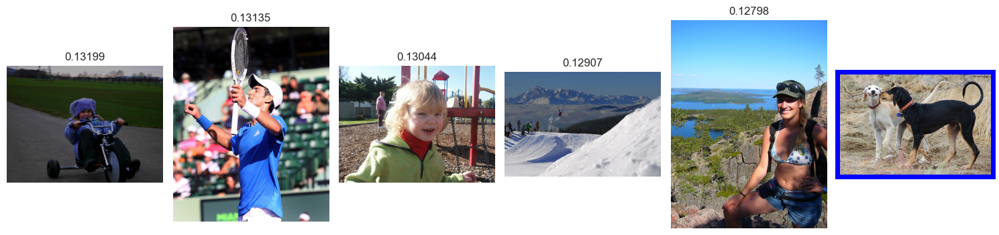

----------------------------------------------------------------------------------------------------

a guy and a girl jumping up in the air

## THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS ##

4/4 [==============================] - 0s 425us/step

-------------------- the man is wearing a backpack and sunglasses while walking through an outdoor market . --------------------



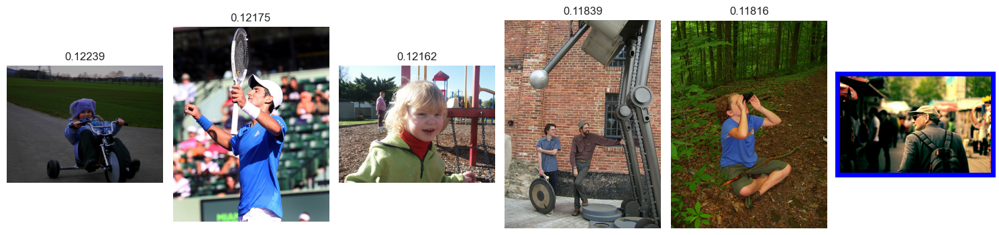

4/4 [==============================] - 0s 15ms/step

-------------------- a man leans against a large robot . --------------------



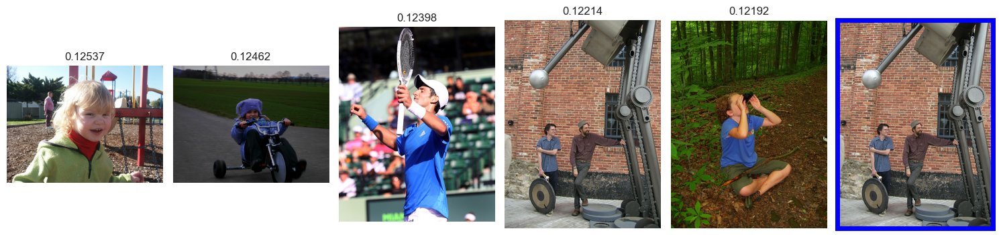

4/4 [==============================] - 0s 6ms/step

-------------------- A man sits on the gravel by an ocean . --------------------



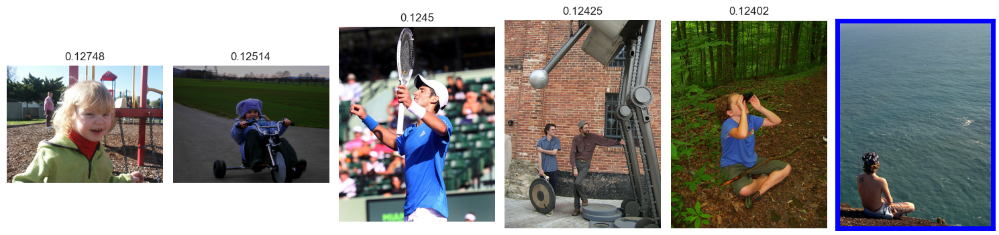

4/4 [==============================] - 0s 2ms/step

-------------------- A white dog with beige spots is running through a field . --------------------



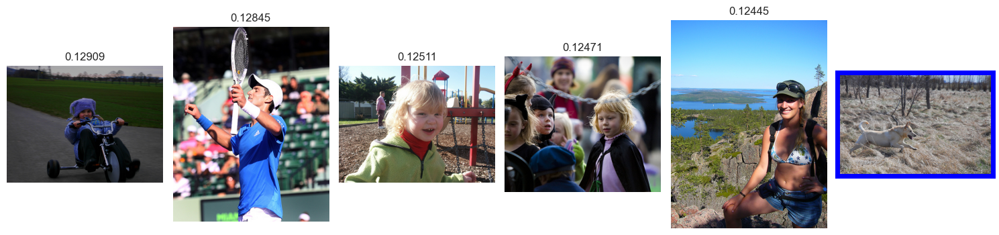

4/4 [==============================] - 0s 12ms/step

-------------------- A brown dog is sitting in some long grass . --------------------



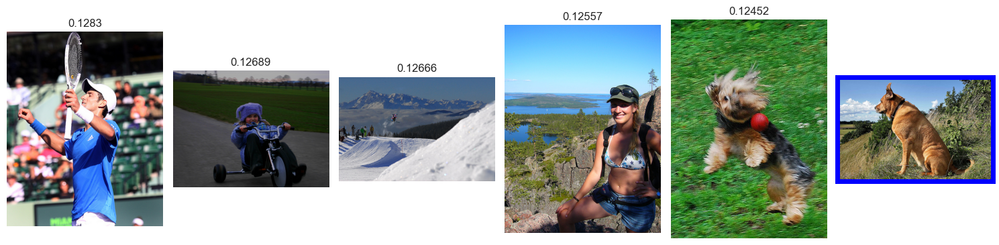

4/4 [==============================] - 0s 17ms/step

-------------------- A salt-and-pepper-haired man with beard and glasses wearing black sits on the grass . --------------------



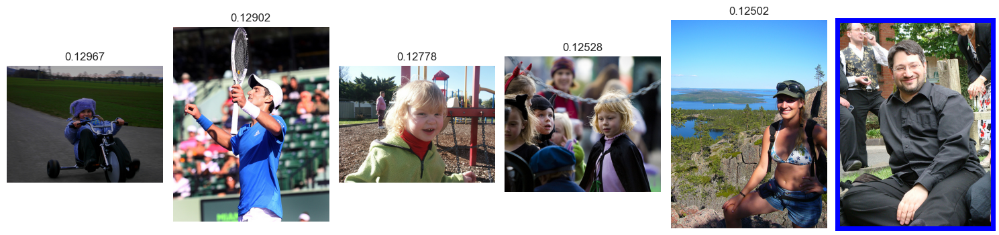

4/4 [==============================] - 0s 1ms/step

-------------------- A blue bird flying over water . --------------------



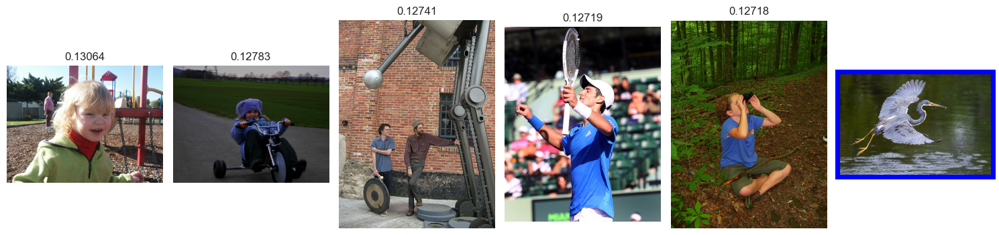

----------------------------------------------------------------------------------------------------

Girls with orange hair standing on the street with some kind of bottle in their hand .

## THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS ##



In [92]:
for text in text_test:
    image_t(text)

 <b> Итоговый вывод:</b> Целью проекта является разработка модели компьютерного зрения для фотохостинга для профессиональных фотографов «Со Смыслом».Для разработки модели предоставлены наборы данных с фотографиями, описаниями, оценками экспертов и краудсорсеров о соответствии изображения описанию.
    
Для обучения модели сформирован датафрейм, содержащий имя файла изображения, идентификатор описания и целевую переменную в значениях от 0 (изображение полностью не соответствует описанию) до 1 (запрос и текст соответствуют полностью). Из набора данных исключены объекты, в описании которых есть указание на изображения детей.
    
Целевая переменная агрегирована на основе экспертных оценок и оценок краудсорсинга относительно соответствия изображения имеющемуся описанию.
    
Признаки сформированы из векторизованных описаний фото (метод TfidfVectorizer()) и изображений (с использованием ResNet50).

    
Мы построили две модели линейной регрессии RidgeCV() и LinearSVR() и две нейросети средствами библиотеки Keras - с эксперементальным подбором параметров и KerasRegressor() с перебором параметров методом  GridSearchCV. Метрикой качества избрали RMSE, на минимизацию которой ориентировались. Наилучшая  Метрика качества достигнута у нейросети KerasRegressor()с перебором параметров методом GridSearchCV (0.068), которая выбрана для теста.
    
При передаче предсказаний нейросети KerasRegressor() тестовому набору данных и распечатывании изображений видно, что модель ищет фотографии с похожим описанием и выдает их с указанием на степень соответствия согласно разработанной нами системе оценок. Изображения детей  на экран не выводятся.

Нельзя сказать, что в изображениях совсем нет ничего общего с описанием, виды, подпадающие под отдельные слова или сюжеты имеются, но степень попадания в распечатанном наборе очень низкая. В точности идентично описанию только фото, соответствующее ему в тестовой выборке.

Разработанная нами модель может быть отправной точкой для усовершенствования системы распознавания изображений.    
